In [1]:
%load_ext autoreload
%autoreload 2

### LE template building pipeline

- data from astrocat
- write data 
- 


In [2]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import splrep, splev, interp2d,LSQBivariateSpline
import matplotlib
from mpl_toolkits.mplot3d import Axes3D

import light_echo as le

In [3]:
from spectra_utils import *

In [4]:
import os
import glob
import json
import pandas as pd
from tqdm import tqdm

import pysynphot
import scipy.optimize as opt
from scipy.optimize import curve_fit


In [5]:
os.environ['PYSYN_CDBS']

'/Users/home/Documents/Research/repos/light_echos/trds/'

In [6]:
snjsonfiles = get_snjsonfiles()

In [16]:
# do not show plots inside notebook
%matplotlib inline

In [8]:
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

plt.rcParams['axes.labelsize'] = 16

plt.rcParams['legend.fontsize'] = 12

### get and load json from astrocat

### write photometry and spectra to files

### read data

### fit photometry

### read data

In [333]:
snid_Ia = ['SN2011fe', 'SN2012fr', 'SN2014J', 'SN2005cf', 'SN2006X',
       'SN2001V', 'SN2003du', 'SN1994D', 'SN1998bu', 'SN2012dn',
       'SN2004dt', 'SN2002bo', 'SN1998aq', 'SN2007le', 'SN2007af',
       'SN1999aa', 'SN2000cx', 'SN2005hk', 'SN2009dc', 'SN2003cg',
       'SN2001ep', 'SN1986G', 'SN1999ac', 'SN2012ht', 'SN1999by',
       'SN2007sr', 'SN2008ar', 'SN2007if', 'SN2008A', 'SN2005M',
       'SN2007S', 'SN1998es', 'SN2007on', 'SN2005am', 'SN2006D',
       'SN1991bg', 'SN2005ke', 'SN2002er', 'SN2001el', 'SN2002fk',
       'SN2012cg', 'SN2004ef', 'SN2008bf', 'SN1996X', 'SN2009ig',
       'SN2016coj', 'SN2003kf', 'SN2011iv', 'SN2006gz', 'SN2011km',
       'SN1992A', 'SN1999dq', 'SN2006le', 'SN1997br', 'SN1999ee',
       'SN2004eo', 'SN2007co', 'SN2003hv', 'SN2001ay', 'SN2001eh',
       'SN2006lf', 'SN2002dj', 'SN1991T', 'SN2005bl', 'SN2008C',
       'SN2003fa', 'SN2013ao', 'SN2006hb', 'SN2011by', 'SN2007hj',
       'SN2009Y', 'SN2010ae', 'SN1994ae', 'SN2008fp', 'SN2006S']

snid_Ia.sort()

In [755]:
snid_Ib = ['SN2008ax', 'SN2009jf', 'SN2008D', 'SN2004ao', 'SN1997ef',
       'SN2005bf', 'SN1998bw', 'SN2004gq', 'SN2014C', 'SN1990B',
       'SN2005az', 'SN2013ek', 'SN2005hg', 'SN1984L', 'SN2007C',
       'SN2008bo', 'SN2015ah', 'SN2007Y', 'SN1990I', 'SN2007uy',
       'SN1954A', 'SN2001ej', 'SN2009iz', 'SN2009er']

snid_Ib.sort()

In [756]:
# from sncatalog spectra>10, phot>10
snid_Ic = ['SN2006jc', 'SN2002ap', 'SN2006aj', 'SN2007gr', 'SN1994I',
       'SN2013ge', 'SN2004aw', 'SN2015bn', 'SN1997ef', 'SN2004gk',
       'SN1998bw', 'SN2003jd', 'SN1990B', 'SN2005az', 'SN2013ek',
       'SN2005hg', 'SN2010md', 'SN2014L', 'SN2012ap', 'SN2013hx',
       'SN2011ke', 'SN2011bm', 'SN2003dh', 'SN2004gt', 'SN2010bh',
       'SN2010gx', 'SN2003bg', 'SN2004fe', 'SN2011kg', 'SN2006ck',
       'SN2001ej', 'SN2007ce', 'SN2009bb']

snid_Ic.sort()

In [13]:
len(snid_Ic)

33

In [14]:
snid_IbIc = list(np.unique(snid_Ib + snid_Ic))

In [757]:
snid_IIb = ['SN1993J', 'SN2011dh', 'SN2008ax', 'SN2013df', 'SN2012dy',
       'SN2011fu', 'SN1996cb', 'SN2001ig', 'SN2011hs', 'SN2013ak',
       'SN2008bo', 'SN2015ah', 'SN2011ei', 'SN2003bg', 'SN2009mg',
       'SN2005la', 'SN2008aq']

snid_IIb.sort()

In [758]:
snid_IIP = ['SN2013ej', 'SN1999em', 'SN2008ax', 'SN2012ec', 'SN2009N',
       'SN2012aw', 'SN2005cs', 'SN2007od', 'SN2008in', 'SN2004et',
       'SN1990E', 'SN2008bk', 'SN1987A', 'SN1992H', 'SN1999gi',
       'SN2004dj', 'SN1986L', 'SN2013am', 'SN2002gd', 'SN2013fs',
       'SN1993K', 'SN2008ag', 'SN1988Z', 'SN2007oc', 'SN1948B',
       'SN1999br', 'SN2013ab', 'SN2007aa', 'SN2000cb', 'SN2006bp',
       'SN1997D', 'SN2008es', 'SN2007it', 'SN2001X', 'SN1988A',
       'SN2003bn', 'SN2002gw', 'SN2003Z', 'SN2010aj', 'SN2008M',
       'SN2008W', 'SN2009E', 'SN2009ib', 'SN2014cy', 'SN2004fc',
       'SN2003hl', 'SN2006be']

snid_IIP.sort()

In [25]:
# write to file

#for snid in snid_IIP:
#    snid = snid[2:]  # remove 'SN' in label
#    try:
#        phot_data, spec_data = get_photometry_spectra(snid=snid, plot=True)
#    except IndexError:
#        print(snid)
#        continue
#

In [26]:
len(snid_Ia), len(snid_IbIc), len(snid_IIb), len(snid_IIP)

(75, 50, 17, 47)

### pipeline

In [3825]:
#snid = '1994d'
#snid = '2008ax'

#snid = '2013ej'
# snid = '1993J'
#snid='2011fe'
snid = '2011fe'
typ = 'Ia'
#snid = snid_IIP[0][2:]

#snid = '2008ax'
#snid = '1999aa'

sndata = get_sndata(snid=snid, snjsonfiles=snjsonfiles)

write_photometry_spectra(snid=snid, sndata=sndata)

sntype = [s['value'] for s in sndata['claimedtype'] ]

phot_data, filts, ext_dict, redshift = le.read_photometry(snid)
filts = [f for f in filts] # change from set to list


# sort phot_data

for i in range(len(phot_data)):
    # sort mjd
    idx_sorted = np.argsort(phot_data[i][0])
    phot_data[i][0] = phot_data[i][0][idx_sorted]
    phot_data[i][1] = phot_data[i][1][idx_sorted]
    phot_data[i][2] = phot_data[i][2][idx_sorted]

# plot
plot = False
if plot:
    plot_photometry(snid, sntype, phot_data, filts)

# find idx of max mag in B band
# 5 used to remove first peak for IIb
cut_ = 1
mjd_max_idx = np.argmin(phot_data[ filts.index('B') ][1][cut_:]) 
mjd_max = phot_data[filts.index('B')][0][mjd_max_idx+cut_]


# find idx of max mag in B band for IIb with some visits of first peak
#mjd_max_idx = np.argmin(phot_data[ filts.index('B') ][1][5:])
#mjd_max = phot_data[filts.index('B')][0][mjd_max_idx+5]

print(mjd_max)

write photometry 2011fe
write spectra 2011fe
55814.794


In [3826]:
len(phot_data)

4

In [3827]:
sntype

['Ia']

In [3828]:
#phot_data[0]

In [3829]:

for lc in phot_data:
    # change mjd to phase
    lc[0] = (lc[0] - mjd_max)/(1.+redshift)

In [3830]:

# get spectra
#mjd_max = phot_data[0][0][0]  # modify later 

spec_data, redshift = read_spectra(snid, mjd_max, A_V = None) # use A_V = ext_dict['V'], 1994d spectra malready dereddened

phases = np.transpose(spec_data)[0]

# sort phases
phases = [sp[0] for sp in spec_data]

spec_data_sorted = []

for i in np.argsort(phases):
    spec = spec_data[i]
    spec_data_sorted.append(spec)

spec_data = spec_data_sorted


(-20.0, 50.0)

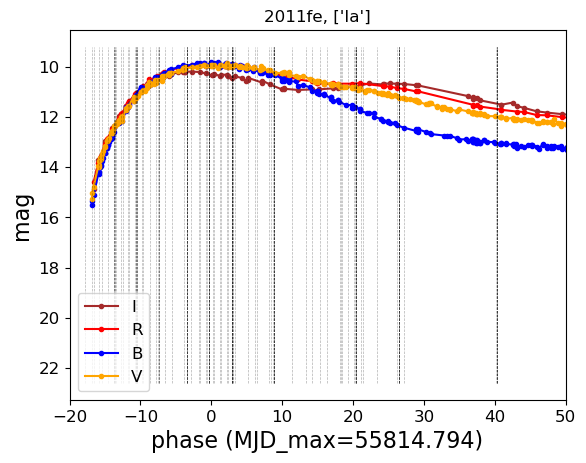

In [3831]:
fig = plot_photometry(snid, sntype, phot_data, filts)

ax = fig.get_axes()[0]

ax.vlines(phases, ymin=ax.get_ylim()[0], ymax=ax.get_ylim()[1],
         linestyle='--', color='k', alpha=.3, linewidth=.5)



ax.set_xlabel(f'phase (MJD_max={mjd_max})')
ax.set_xlim([-20, 50])
#ax.set_ylim([18, 14])
#fig.savefig(f"{snid}_phot.png")


In [3863]:
filts

['I', 'R', 'B', 'V']

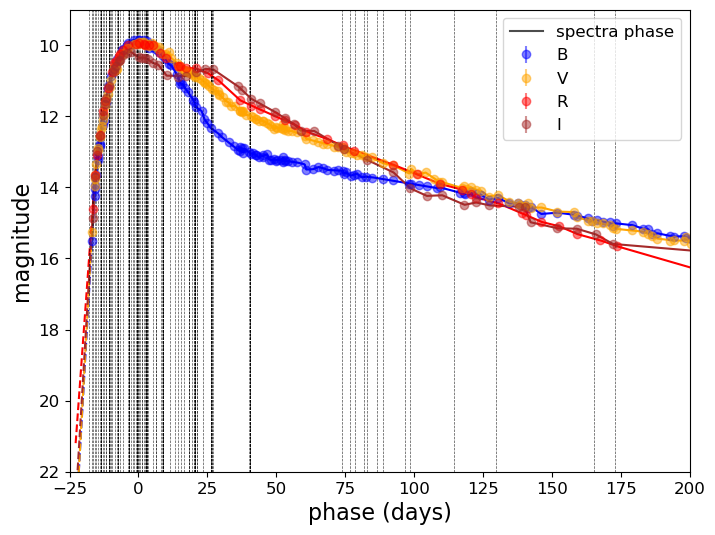

In [3833]:
plt.figure(figsize=(8, 6))
# subsample
step = 3
for dat in phot_data:
    dat[0] = dat[0][::step]
    dat[1] = dat[1][::step]
    dat[2] = dat[2][::step]

#splines = fit_light_curve(phot_data, filts, filts_order=['B', 'V', 'R', 'I'],
#                          spec_phase=phases, linear=True, 
#                          plot=True, xlim=[-25, 200], ylim=[22, 9])
splines = fit_light_curve(phot_data, filts, filts_order=filts,
                          spec_phase=phases, linear=True, 
                          plot=True, xlim=[-25, 200], ylim=[22, 9])


plt.savefig(f"./LEtemp/{typ}/{snid}_phot.png")

In [3864]:
df_phot = pd.DataFrame(columns=['phase', 'B', 'V', 'R', 'I'])

In [3865]:
ph = np.arange(-20, 100)
for p in ph:
    phot = le.generate_photometry_for_epoch(p, 
                                            bands=['B', 'V', 'R', 'I'],
                                            splines=splines)
    phot['phase'] = p
    df_phot.loc[len(df_phot)] = phot

In [3861]:
df_phot

,phase,B,V,R,I
0,-20,19.78039993504411,19.684355456425564,18.222570876403203,19.267515325841103
1,-19,18.420935685668805,18.279680056576606,17.15317244494183,17.965345626963853
2,-18,17.061471436293502,16.87500465672765,16.083774013480454,16.663175928086602
3,-17,15.702007186918214,15.47032925687869,15.014375582019081,15.361006229209348
4,-16,14.335669798321279,14.07299539175473,13.949008960903509,14.05883653033209
...,...,...,...,...,...
115,95,13.847010882967467,13.477986858576067,13.438848101088677,13.75570364751087
116,96,13.860011256768097,13.517598821970962,13.470976008173853,13.829093475319315
117,97,13.873011630568728,13.557210785365855,13.503103915259029,13.90248330312776
118,98,13.88601200436936,13.596822748760749,13.535231822344205,13.975873130936202


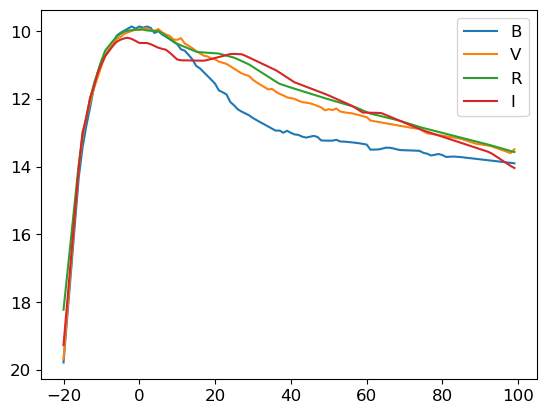

In [3866]:
for b in ['B', 'V', 'R', 'I']:
    plt.plot(df_phot.phase, df_phot[b], label=b, )
plt.gca().invert_yaxis()
plt.legend()

In [3869]:
# save phot files
#np.savez(f"LEtemp/phot/{snid}_phot.npz", filts=['B', 'V', 'R', 'I'], 
#         splines=splines, df_phot=df_phot,
#         snid=snid, sntype=sntype, )#dtype='object')


In [3632]:
### fit Vacca & Leibundgut 1996 model

#xdat = phot_data[0][0]
#ydat = -phot_data[1][1]
#
#popt, pcov = curve_fit(lc_model_vacca, xdat, ydat, )
#
#xdat_new = np.arange(-10, 160, 1.)
#yfit = lc_model(xdat_new, *popt)
#plt.plot(xdat, ydat, 'r*', xdat_new, yfit,'y-');
#

In [3870]:
# scale to photmetry
for i, spec in enumerate(spec_data):
    if len(np.unique(spec[1]))==len(spec[1]):
        # to assert no duplicate wavelength
        try:
            # remove telluric lines
            spec[2] = remove_peak(spec[1], spec[2], tlines=[6563, 5888, 7545,
                                                            6565, 4850, 4950, 5010,
                                                            6415, 7510, 6778, 7778], peak_idx=[], width_idx=10)
            
            # scale
            scale, mags_from_phot = le.scale_flux_to_photometry_pysyn(spec[0], 
                            spec[1], spec[2], splines, filts, template=None);
            spec[2] *= scale
        except:
            pass
        print(scale)
        print(i, spec[0])



Warning, 15 of 4448 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 15 of 4448 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonh

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 15 of 4448 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. 

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 15 of 4448 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. 

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 15 of 4448 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. 

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
1.0937499999999677e-15
2 -16.58066914201442
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be 

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 5 of 4681 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. T

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 5 of 4681 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. T

Warning, 5 of 4681 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 5 of 4681 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst

0.9221466583204012
8 -13.666172397391772
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be use

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

1.0244012397035702
36 -3.365239347562704
1.0244012397035702
37 -3.3629961510966253
1.0244012397035702
38 -3.3568460957383697
1.0244012397035702
39 -3.354602899272291
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/com

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

1.02062166848309
50 -0.32600788966173644
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be use

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

1.0612348792340667
77 8.808987573991274
1.0612348792340667
78 8.859611872050841
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. 

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
1.6015624999999695e-15
82 15.3

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 2691 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. T

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 2691 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. T

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 2691 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. T

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

0.9893543065682098
108 40.32353487795721
0.9893543065682098
109 40.33190814584913
0.9893543065682098
110 40.34125063448853
0.9893543065682098
111 40.347425669756845
0.9893543065682098
112 40.37322992314139
0.9893543065682098
113 40.39222465137623
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 3486 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. T

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
1.0571117106299064
119 86.73626404370572
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be use

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
1.0586922585948344
120 88.73465733549911
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be use

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
2.593749999999973e-15
123 114.

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 3285 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. T

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 3285 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. T

Warning, 1 of 3448 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 3448 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

Warning, 1 of 3374 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 1 of 3374 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Researc

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 5 of 3276 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. T

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 5 of 3276 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. T

Warning, 5 of 3276 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 5 of 3276 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 4 of 3270 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. T

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 4 of 3270 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. T

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 4 of 3270 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. T

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 2 of 3261 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. T

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 2 of 3261 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. T

Warning, 2 of 3261 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 2 of 3261 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst

Warning, 14 of 3380 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 14 of 3380 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonh

Warning, 3 of 7045 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 3 of 7045 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 3686 of 11886 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat tabl

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 3686 of 11886 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat tabl

(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_b_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_v_004_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Warning, 127 of 1480 bins contained negative fluxes; they have been set to zero.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_i_003_syn.fits) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(/Users/home/Documents/Research/repos/light_echos/trds/comp/nonhst/johnson_r_003_syn.fits) does not have a defined binset in the wavecat table.

In [3634]:
#fig = plot_spectra(snid, spec_data, ncol=5)

In [3635]:

# interporlate spectra for making heatmap 

"""
phases = []

wave_interp = np.arange(3000, 10000, 1)

flux_interp = []

# standard deviation with in rolling window 
flux_interp_std = []
# subtract moving avarage
flux_res = []

for spec in spec_data:
    phase = spec[0]
    wave = spec[1]
    flux = spec[2]
    
    if (phase<400) and (flux.max()<1):
        phases.append(phase)
        
        flux_p = np.interp(wave_interp,
                wave, flux, right=np.nan, left=np.nan)
        
        flux_p_roll = pd.Series(flux_p).rolling(window=10, center=True)
        flux_p_std = flux_p_roll.std()
        flux_p_mean = flux_p_roll.mean()
        
        flux_interp.append(flux_p)
        flux_interp_std.append(flux_p_std)
        flux_res.append(flux_p - flux_p_mean)
"""     

'\nphases = []\n\nwave_interp = np.arange(3000, 10000, 1)\n\nflux_interp = []\n\n# standard deviation with in rolling window \nflux_interp_std = []\n# subtract moving avarage\nflux_res = []\n\nfor spec in spec_data:\n    phase = spec[0]\n    wave = spec[1]\n    flux = spec[2]\n    \n    if (phase<400) and (flux.max()<1):\n        phases.append(phase)\n        \n        flux_p = np.interp(wave_interp,\n                wave, flux, right=np.nan, left=np.nan)\n        \n        flux_p_roll = pd.Series(flux_p).rolling(window=10, center=True)\n        flux_p_std = flux_p_roll.std()\n        flux_p_mean = flux_p_roll.mean()\n        \n        flux_interp.append(flux_p)\n        flux_interp_std.append(flux_p_std)\n        flux_res.append(flux_p - flux_p_mean)\n'

In [3636]:
len(phases), len(flux_res)

(25, 59)

In [3637]:
#fig, ax = plt.subplots(figsize=(8, 4))
#ax.imshow( np.vstack(flux_interp), aspect='auto', 
#          origin='lower', interpolation='nearest', vmin=1e-16, vmax=1e-14)
#
#ax.set_xlabel('wavelength')
#ax.set_ylabel('phase')
#ax.set_xticks(np.arange(0, 7000, 1000))
#ax.set_xticklabels(np.arange(0, 7000, 1000)+3000);
#
#ax.set_yticks(np.arange(0, len(phases))[::5])
#ax.set_yticklabels([f"{p:.2f}" for p in phases[::5]] )
#
#
#ax.grid(linewidth=.5, alpha=.5);
#ax.set_title(f'{snid} spectra')
#
#fig.savefig(f"plots/core_collapse/{snid}_spectra_heatmap.png")

In [3638]:
#np.unique(np.vstack(flux_interp_std)>6e-15)

In [3639]:
# plot noise heatmap
#fig, ax = plt.subplots(figsize=(8, 4))
#imgout = ax.imshow( np.vstack(flux_interp_std[:]), 
#                   aspect='auto', origin='lower',
#                   interpolation='nearest',
#                   cmap="RdBu_r", norm=matplotlib.colors.LogNorm());
#
#ax.set_xlabel('wavelength')
#ax.set_yticks(np.arange(0, len(phases))[::5])
#ax.set_yticklabels([f"{p:.2f}" for p in phases[::5]] )
#ax.set_ylabel('phase')
#
#ax.set_xticks(np.arange(0, 7000, 1000))
#ax.set_xticklabels(np.arange(0, 7000, 1000)+3000);
#
#ax.grid(linewidth=.5, alpha=.5);
#
#ax.set_title(f'{snid}_spectra_noise')
#
#plt.colorbar(imgout,)
#
##fig.savefig(f"plots/core_collapse/{snid}_spectra_noise_heatmap.png")
#

In [3640]:
#for f in flux_interp:
#    plt.plot(wave_interp, f+i*1e-14)


### make light echo spectra template

In [3641]:
#phases

In [3642]:
#flux_interp


Spectres: new_wavs contains values outside the range in spec_wavs. New_fluxes and new_errs will be filled with the value set in the 'fill' keyword argument (nan by default).



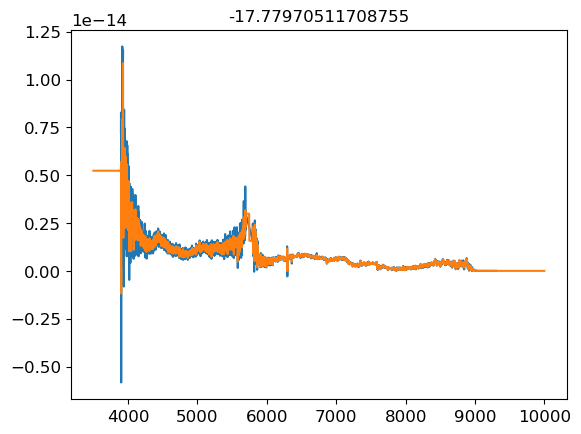


Spectres: new_wavs contains values outside the range in spec_wavs. New_fluxes and new_errs will be filled with the value set in the 'fill' keyword argument (nan by default).



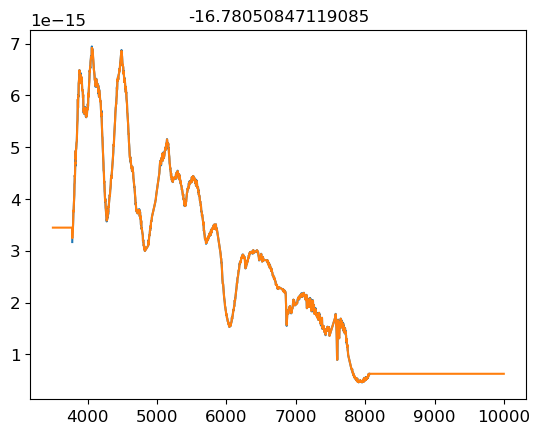

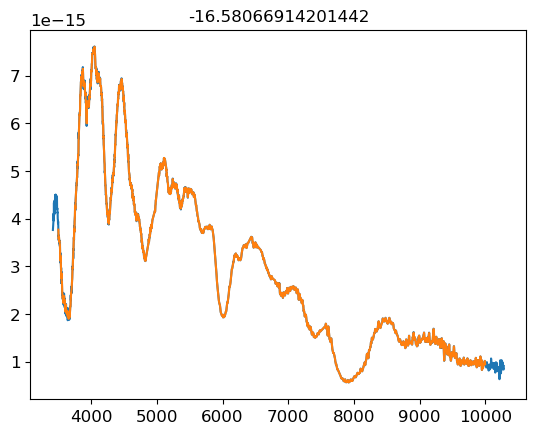

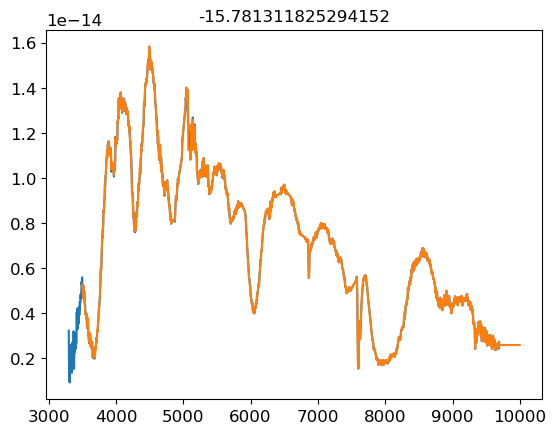

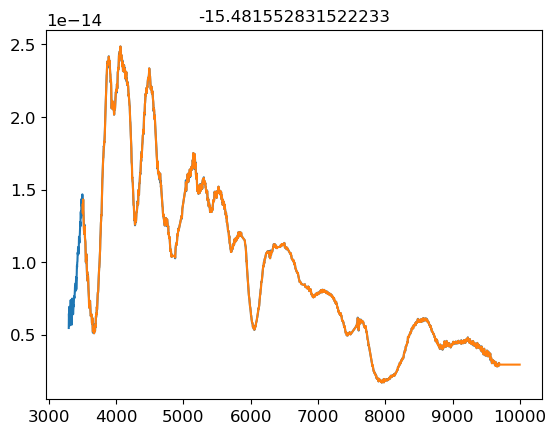

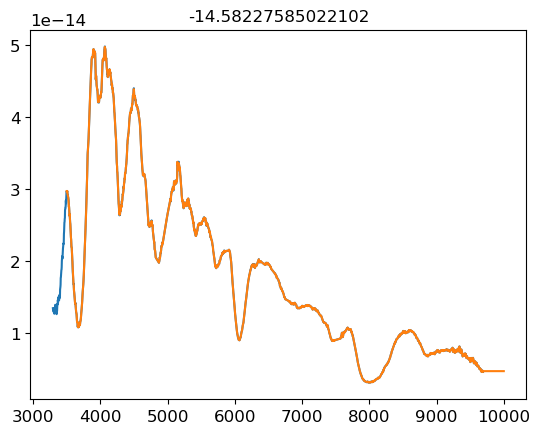

...

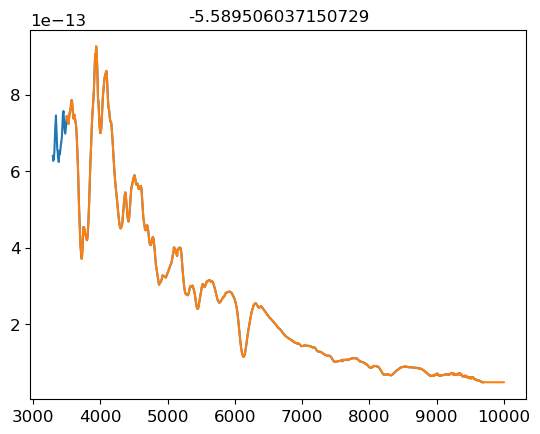

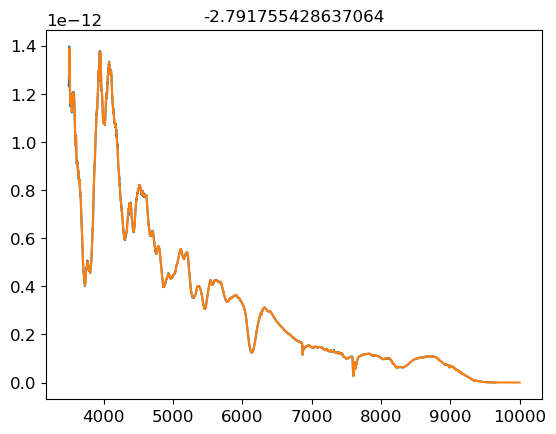

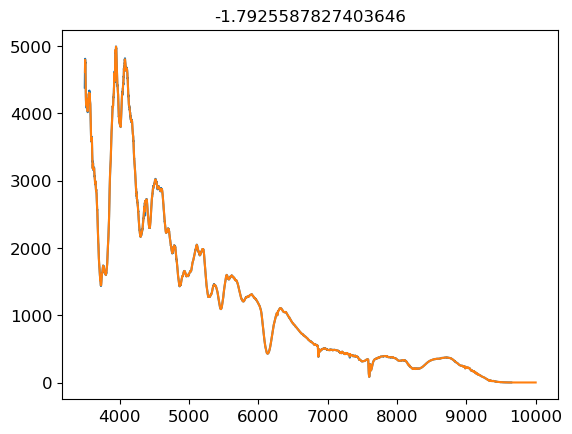

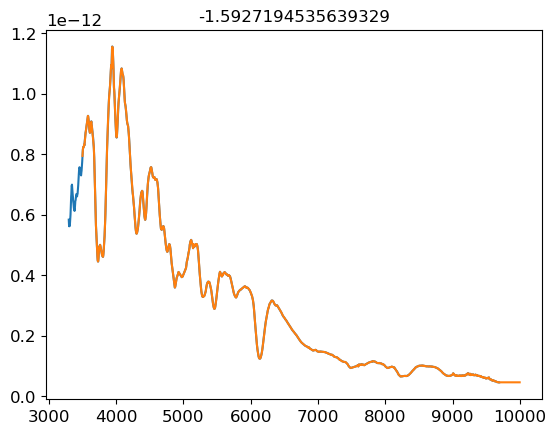

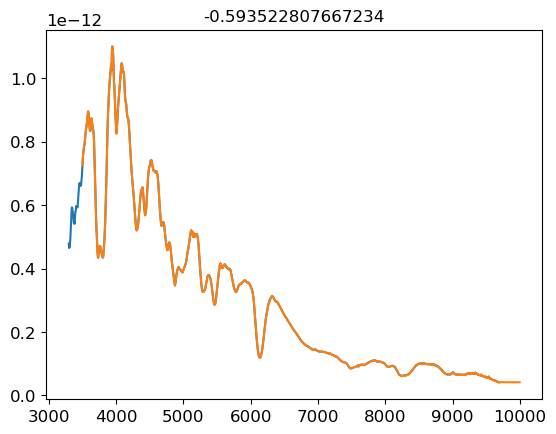


Spectres: new_wavs contains values outside the range in spec_wavs. New_fluxes and new_errs will be filled with the value set in the 'fill' keyword argument (nan by default).



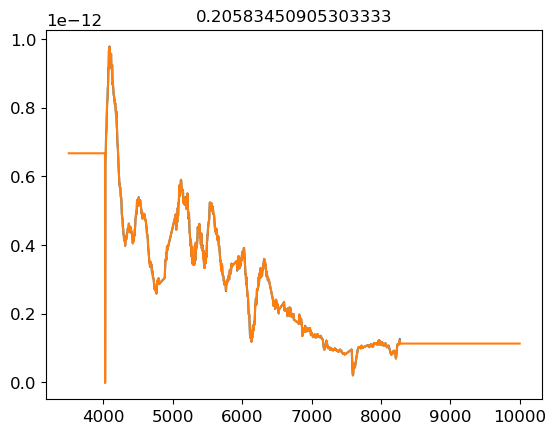

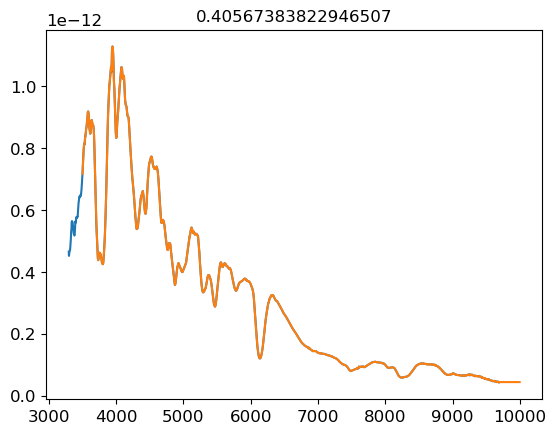

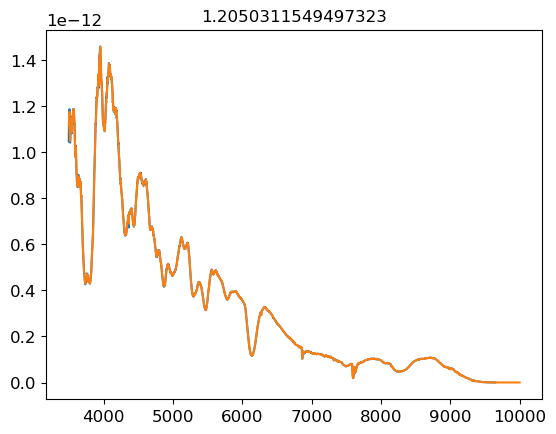

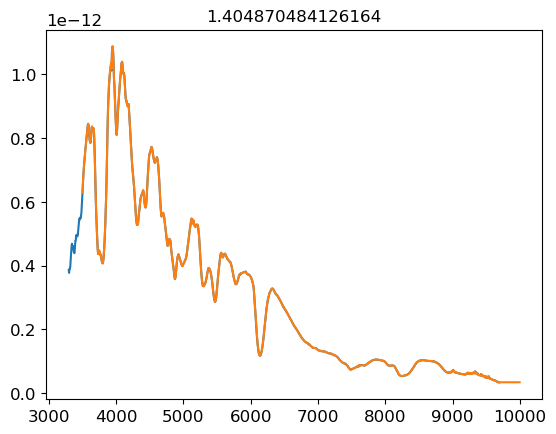

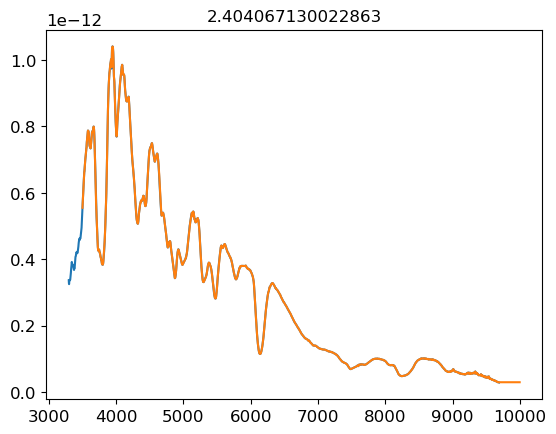

...

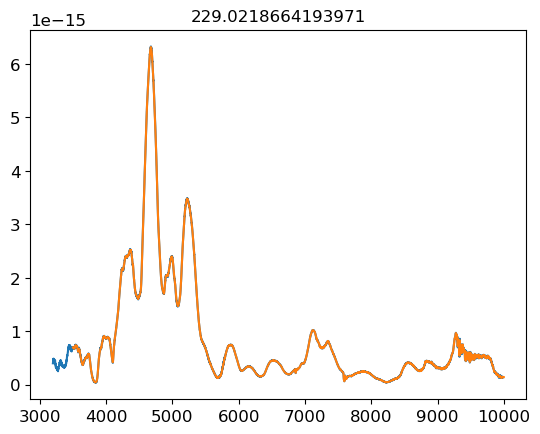

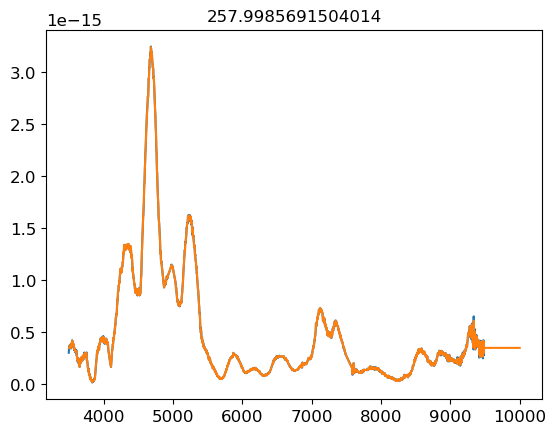

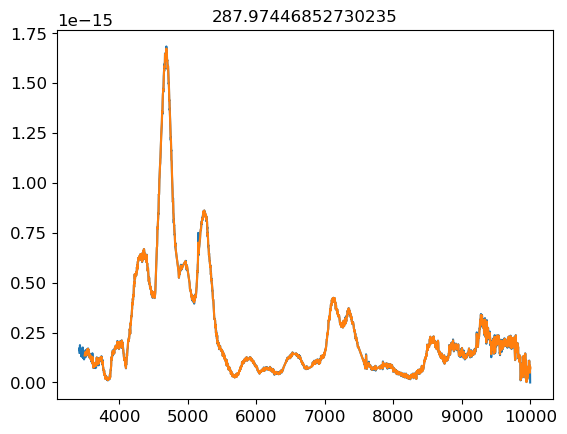

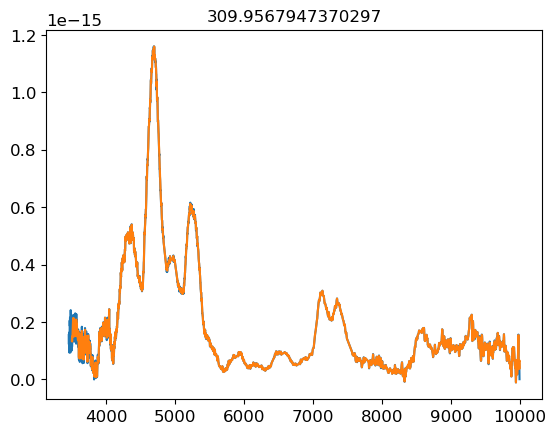

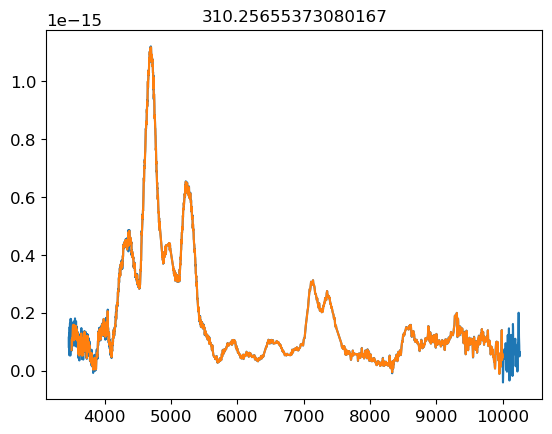


Spectres: new_wavs contains values outside the range in spec_wavs. New_fluxes and new_errs will be filled with the value set in the 'fill' keyword argument (nan by default).



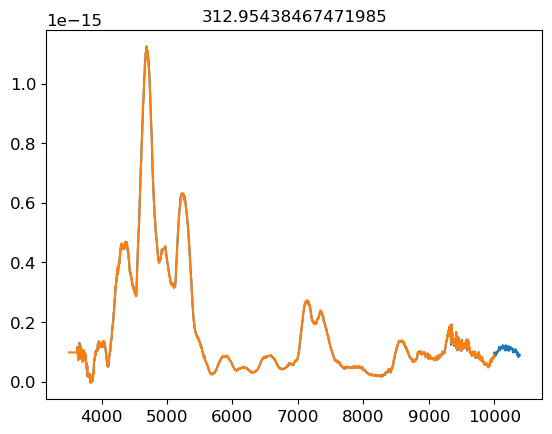

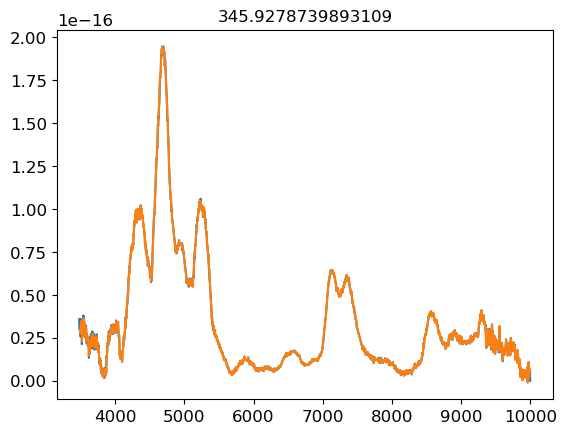

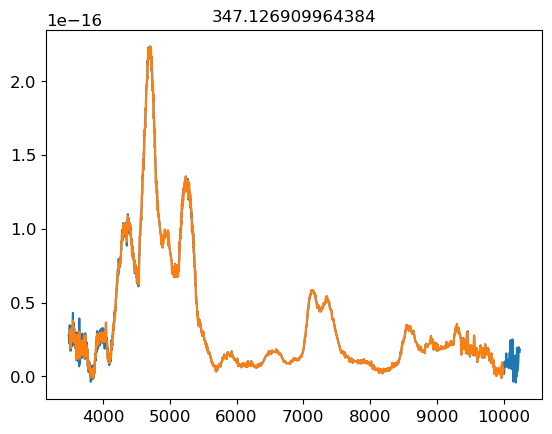

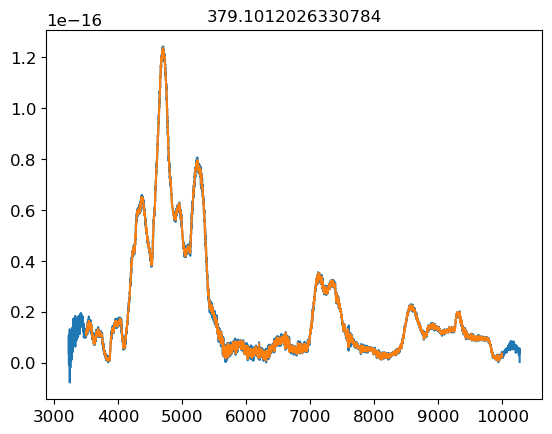

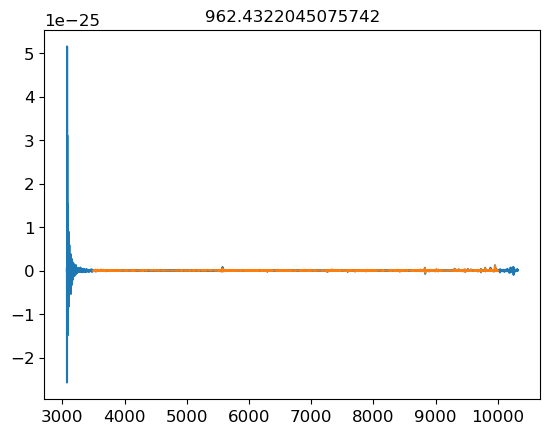

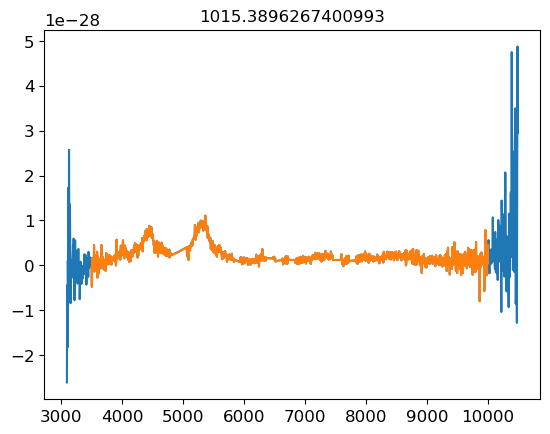

In [3871]:
#interpolate spectra, spectra without the input wavength coverage will be removed
specnew, phases, waves  = le.prepare_spec([5200, 7000], spec_data, 
                                          plot=True, dw=2,)


In [3644]:
phases[8]

0.04977685038264498

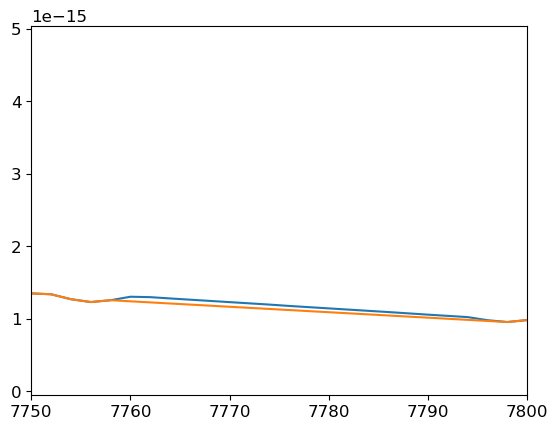

In [3645]:
ph = phases[0]

x = specnew[ph]['wavelength_interp']
y = specnew[ph]['flux_interp']
plt.plot(x, y)
#

# remove telluric line
#plt.xlim([7750, 7800])
y_nopeak = remove_peak(x, y, tlines=[6415, 7510, 6778, 7778], peak_idx=[], width_idx=10)
plt.plot(x, y_nopeak)


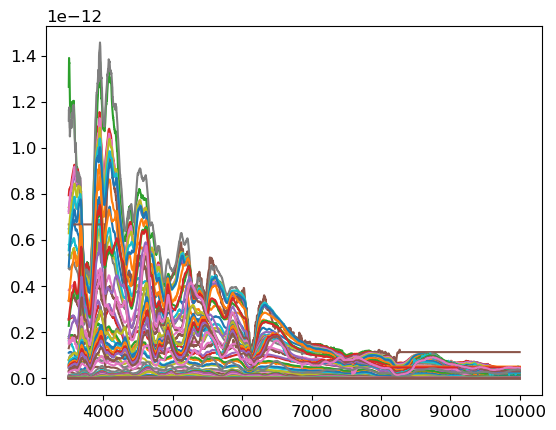

In [3872]:
phases = np.array(list(specnew.keys()))

for ph in phases:
    #print(ph)
    if np.max(specnew[ph]['flux_interp'])<1e-3:
        plt.plot(specnew[ph]['wavelength_interp'], specnew[ph]['flux_interp'], )
    else:
        # remove outliers
        specnew.pop(ph)
        #plt.ylim([0, 1e-12])
phases = np.array(list(specnew.keys()))


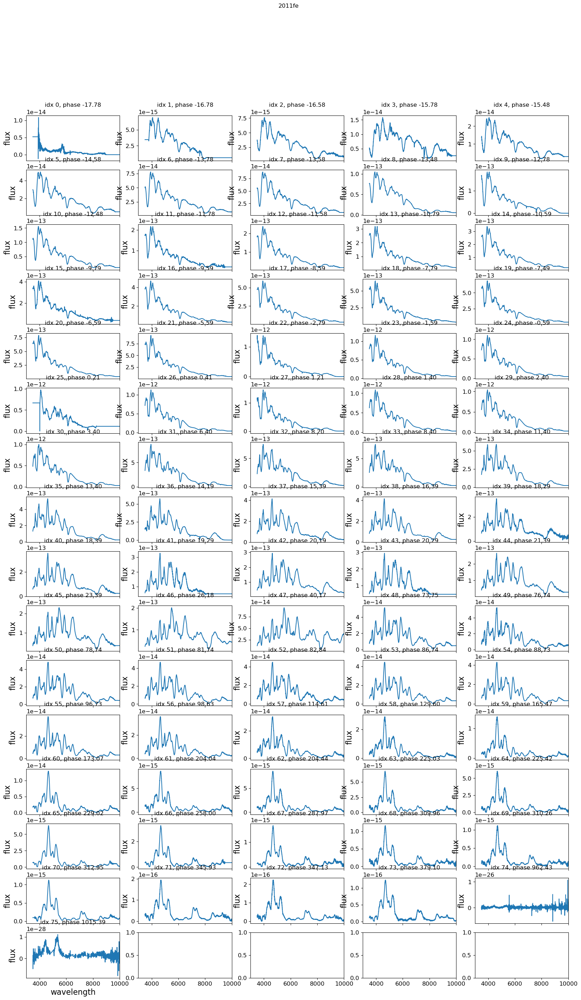

In [3699]:
fig = plot_spectra_dict(snid, specnew, ncol=5, saveto=f"./LEtemp/{typ}/")



In [3893]:
# remove high noise one

specnew.pop(phases[22])
phases = np.array(list(specnew.keys()))


In [3894]:
for i in phases:
    print(i)

-17.77970511708755
-16.78050847119085
-16.58066914201442
-15.781311825294152
-15.481552831522233
-14.58227585022102
-13.782918533500753
-13.58307920432432
-13.483159539728835
-12.783721887604054
-12.483962893832135
-11.784525241707355
-11.584685912530924
-10.785328595810656
-10.585489266634225
-9.786131949913957
-9.586292620737526
-8.587095974840826
-7.787738658120559
-7.487979664348641
-6.588702683047428
-5.589506037150729
-1.5927194535639329
-0.593522807667234
0.40567383822946507
1.2050311549497323
1.404870484126164
2.404067130022863
3.4032637759195623
6.400853713609659
8.199407676226626
8.399247005403057
11.396836943093154
13.395230234886553
14.19458755160682
15.393623526679951
16.39282017257665
18.291293799781833
18.391213464370047
19.290490445678532
20.189767426987014
20.289687091575228
21.388803402060145
23.387196693853543
26.18494730236721
40.173700344920995
73.74670764704862
76.74429758473873
78.74269087653212
81.74028081422222
82.83939712470713
86.73626404370572
88.73465733549

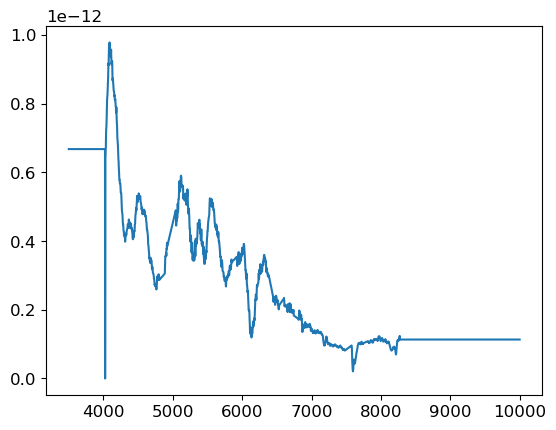

In [3877]:
s_ = specnew[0.20583450905303333]

plt.plot(s_['wavelength_interp'], s_['flux_interp'])



In [3701]:
len(specnew)

76

In [3702]:
len(phases)

76

In [3895]:
# interpolate if there are nans
for ph_ in phases:
    spec_ = specnew[ph_]
    x_spec = spec_['wavelength_interp']
    y_spec = spec_['flux_interp']
    if len(np.where(np.isnan(y_spec))[0])>0:
        print(ph_)
        # interpelate
        y_spec[np.isnan(y_spec)] = np.interp(x_spec[np.isnan(y_spec)], 
                                             x_spec[~np.isnan(y_spec)], 
                                             y_spec[~np.isnan(y_spec)])

In [3896]:
#specnew

In [3897]:
arr2d = []
for i,phase in enumerate(np.sort(list(specnew.keys()))):
    arr2d.append(specnew[phase]['flux_interp'])

weight2d = []
for i,phase in enumerate(np.sort(list(specnew.keys()))):
    weight2d.append(specnew[phase]['weight_interp'])


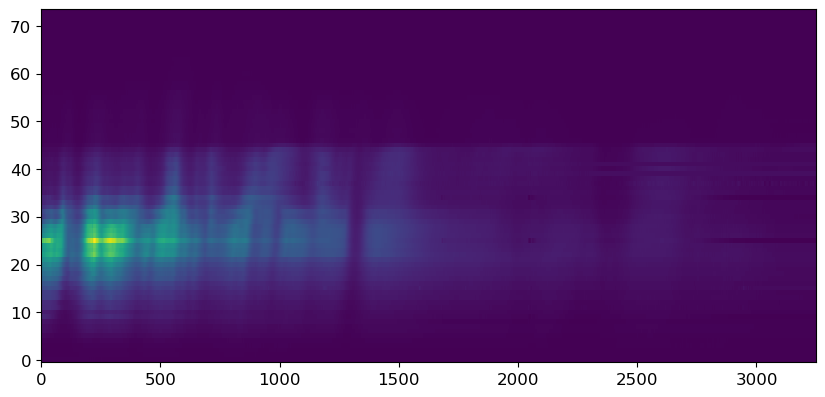

In [3898]:
x = waves
y = np.unique(phases)
X, Y = np.meshgrid(x, y)
Z = np.asarray(arr2d)
W = np.asarray(weight2d)

plt.figure(figsize=[10,10])
plt.imshow(Z, aspect=20, origin='lower', interpolation='none')


In [3899]:
Z.shape

(74, 3250)

In [3900]:

#plt.figure(figsize=[10,10])
#plt.imshow(W, aspect=20, origin='lower', interpolation='none')

In [3901]:
pint_range=[-20, 100]

In [3902]:
X.shape, Y.shape, Z.shape

((74, 3250), (74, 3250), (74, 3250))

In [3903]:
x2 = waves
y2 = np.arange(pint_range[0], pint_range[1], 1)
# y2 = np.arange(0, 90, 1)

# f = interp2d(x, y, Z, kind='linear')
# Z2 = f(x2, y2)

tx = x
ty = y
splrep = LSQBivariateSpline(X.ravel(), Y.ravel(), Z.ravel(), tx, ty, w=W.ravel(), kx=1, ky=1)
Z2 = np.transpose(splrep(x2,y2))

X2, Y2 = np.meshgrid(x2, y2)



/Users/home/miniconda3/envs/datasci/lib/python3.8/site-packages/scipy/interpolate/fitpack2.py:1272: UserWarning: 
The coefficients of the spline returned have been computed as the
minimal norm least-squares solution of a (numerically) rank deficient
system (deficiency=6652). If deficiency is large, the results may be
inaccurate. Deficiency may strongly depend on the value of eps.
  warnings.warn(message)


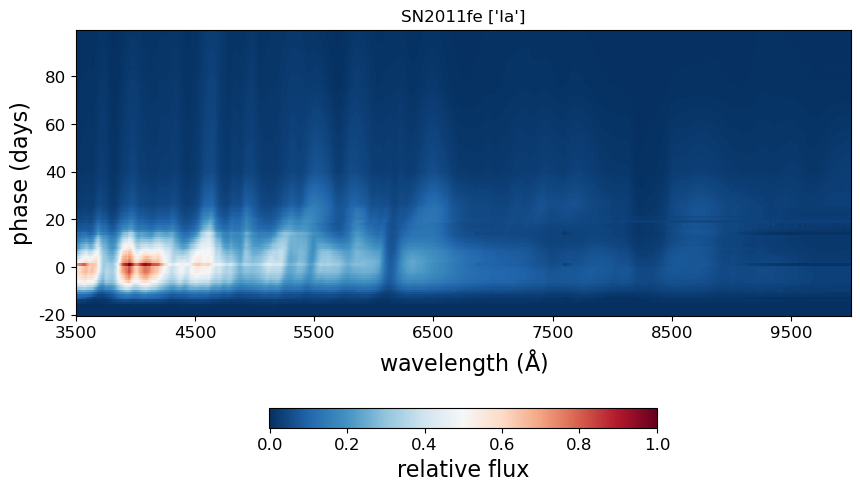

In [3904]:
plt.figure(figsize=[10,8])
plt.imshow(Z2/Z2.max(), aspect=10, origin='lower', 
           interpolation='none', cmap=matplotlib.cm.RdBu_r)
xticks = [0, 500, 1000, 1500, 2000, 2500, 3000]

plt.xticks(xticks, labels=np.int32(X2[0][xticks]));
plt.xlabel(r'wavelength ($\mathrm{\AA}$)')
yticks = [0, 20, 40, 60, 80, 100]
plt.yticks(yticks, labels=Y2[:, 0][yticks])
plt.ylabel(r'phase (days)')

cbar = plt.colorbar(orientation='horizontal', shrink=0.5)
cbar.set_label('relative flux')
plt.title(f"SN{snid} {sntype}")
plt.savefig(f"LEtemp/{typ}/{snid}_spectra_heatmap_.png", dpi=300)


### save to npz

In [3905]:
snid

'2011fe'

In [3906]:
np.savez(f"LEtemp/{typ}/LEtemplate_SN{snid}.npz", specnew=specnew, waves=waves, phases=phases, 
         X=X, Y=Y, Z=Z, X2=X2, Y2=Y2, Z2=Z2,
         snid=snid, sntype=sntype,)


### make template

In [ ]:
lechos = []
lecho_d1 = le.mklecho_tophat(X2, Y2, Z2, p_int = [-20,20])
#lecho_d2 = le.mklecho_tophat(X2, Y2, Z2, p_int = [20,60])
lecho_d3 = le.mklecho_tophat(X2, Y2, Z2, p_int = [-20, 100])
lechos.append([X2[0], lecho_d1])
#lechos.append([X2[0], lecho_d2])
lechos.append([X2[0], lecho_d3])

In [ ]:
#fig, ax, = le.basic_format(size=[8,4])

fig, ax = plt.subplots(1, 1, figsize=(8, 4))
labels = ['-20 to +20 days', '-20 to +100 days']
ls = ['-','--', '-']

for i, lecho in enumerate(lechos):
    scale = 1./np.amax(lecho[1])
#     scale = 1.
    plt.plot(lecho[0], scale*lecho[1], label = labels[i], linestyle=ls[i], lw=1)
    
plt.xlabel('wavelength ($\mathrm{\AA}$)', fontsize=16)
plt.ylabel('relative flux', fontsize = 16)
plt.legend(fontsize=12, frameon=True, bbox_to_anchor=(1., 1.0))
plt.xlim(3500,9500)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.title(f'SN{snid} {sntype}', fontsize=16)


# plot spectral lines
plt.vlines(x=6563, ymin=0, ymax=1, colors='k', linewidth=.2)

#for x in [5577, 6300, 7775]:
#    plt.vlines(x=x, ymin=0, ymax=1, colors='k', linewidth=.2)
#    plt.text(x=x, y=0.1, s=fr'O I')

plt.text(x=6563, y=0.1, s=r'H $\alpha$')


plt.savefig(f'LEtemp/{typ}/{snid}_lecho.png', dpi = 300, bbox_inches = 'tight')
# plt.savefig('plots/1994d_lecho.png', dpi = 300, bbox_inches = 'tight')

### END

In [ ]:
#fl = flux_interp[25]
#
#roll_mean = pd.Series(fl).rolling(window=10, center=True).mean()
#
#plt.plot(wave_interp, fl)
#plt.plot(wave_interp, roll_mean)
#
#res = fl - roll_mean
#
##plt.xlim([5800, 6000])

### remove telluric lines

In [ ]:
telluric_lines = [3729, 3996, 4341, 4834, 4862, 5007, 
                  5423, 5850, 6129, 6563, 6583, 
                  6617, 6716, 
                  6957, 9070, 9532, 9722] 

In [ ]:
def remove_peak(x, y, tlines=[], peak_idx=[], width_idx=10, height=1, ):
    """remove the telluric peak
    Parameters:
        x, y: array
        width_idx: int, width of the points to remove
    
    """
    if len(tlines)!=0:
        peak_idx = []
        for tline in tlines:
            peak_idx.append(np.argmin( np.abs(x - tline)))
        
        peak_idx = np.array(peak_idx)

    #if len(peak_idx)==0:
    #    # find the peak location use scipy.signal
    #    peak_idx, peak_dict = signal.find_peaks(y, height=height, width=0)

    # find the index of peak area
    peak_left = np.concatenate([peak_idx - i for i in range(width_idx)])
    peak_right = np.concatenate([peak_idx + i for i in range(width_idx)])
    peak_area = np.concatenate([peak_left, peak_right])
    peak_area.sort()
    
    # linear interpolate peak area
    y_nopeak = y.copy()
    no_peak_area = np.delete(np.arange(0, len(x)), peak_area)
    y_nopeak[peak_area] = np.interp(x[peak_area], 
                                    x[no_peak_area], 
                                    y[no_peak_area])
    
    return y_nopeak
    


In [ ]:
#for i, spec in enumerate(spec_data[:]):
#
#    #print (spec[0]*(1+float(redshift)) + mjd_max);
#    plt.figure(figsize=[6,4])
#    
#    x = spec[1]
#    y = spec[2]
#    plt.plot(spec[1], spec[2])    
#    
#    yhat = y.copy()
#    for line in telluric_lines:
#        if line>x.min() and line<x.max():
#            # find the index of telluric lines
#            idx_line = np.argmin( np.abs(np.around(x) - line ) )
#            yhat = remove_peak(x, yhat, peak_idx=np.array([idx_line]), 
#                               width_idx=5 )
#    
#    plt.plot(x, yhat)
#    # replace the spectra with removed spectra lines
#    spec[2] = yhat
#
#    plt.title(f'{i} phase {spec[0]}')
#    plt.xlabel("wavelength")
#    plt.ylabel("flux")
#    #plt.ylim([0, 300])
#    plt.xlim([3000, 10000])
#    